In [3]:


import torch
import torch.nn as nn
import numpy as np

from torch.utils.data import Dataset

import pandas, random, numpy
import matplotlib.pyplot as plt

from PIL import Image, ImageOps


import glob
import PIL

from sklearn.model_selection import train_test_split


In [4]:

civs_path = 'data/imgs.new.CIVS'


In [5]:

path  = civs_path

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names

n_images = len(paths)

rand_idxs = np.random.permutation(n_images)

paths_subset = np.random.choice(paths, n_images , replace=False) 
all_paths    = paths_subset[rand_idxs]

print(n_images)


5016


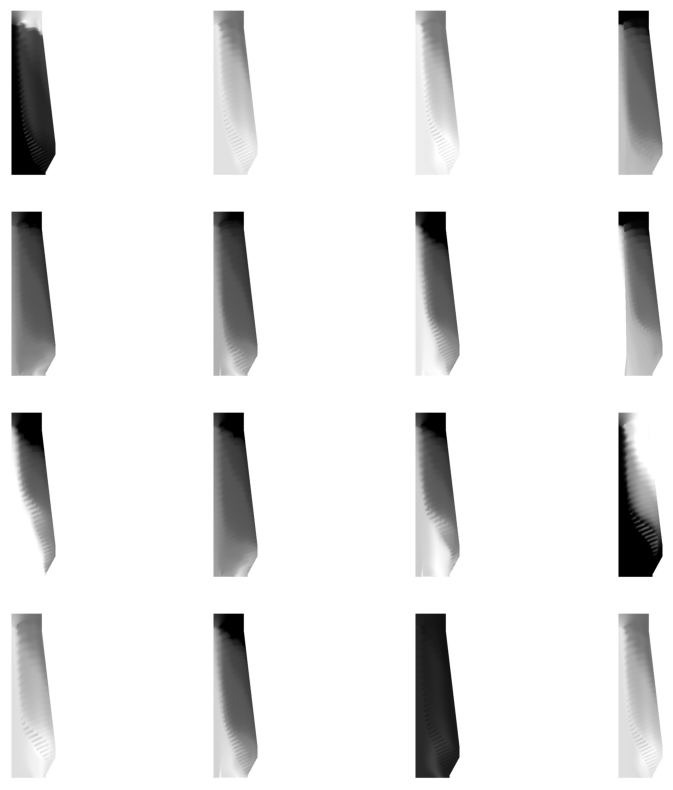

In [6]:

_, axes = plt.subplots(4, 4, figsize=(10, 10))

for ax, img_path in zip(axes.flatten(), all_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")


In [7]:

## data/imgs.new.CIVS/h2_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2o_Ng0_Pci150_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg

    
## ['tg', 'Ng0', 'Pci175', 'H0', 'Wp0', 'Ph300', 'Ox24', 'Ow7', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
    


In [8]:

'''

['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']
['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']


'''


"\n\n['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']\n['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n\n\n"

In [9]:

def label_func2(fname):
    ## print(fname)
    fname = fname.replace("data/imgs.new.CIVS/","")
    temp_name = fname.replace(".jpg", "").split("_")
    ## print(temp_name)
    
  
    y0 = temp_name[0]                              ## tg
    y1 = float(temp_name[1].replace("Ng", ""))     ## 'Ng0'
    y2 = float(temp_name[2].replace("Pci", ""))    ## 'Pci175'
    y3 = float(temp_name[3].replace("H", ""))     ## 'H0'
    y4 = float(temp_name[4].replace("Wp", ""))     ## 'Wp0'
    y5 = float(temp_name[5].replace("Ph", ""))     ## 'Ph300'
    y6 = float(temp_name[6].replace("Ox", ""))    ## 'Ox24'
    y7 = float(temp_name[7].replace("Ow", ""))     ## 'Ow7
    y8 = float(temp_name[8].replace("Hbt", ""))    ## 'Hbt1459.8'
    y9 = float(temp_name[9].replace("Wm", ""))    ## 'Wm12.2'
    y10 = float(temp_name[10].replace("Wr", ""))    ## 'Wr308750.4'
    
 
    ## np.array([y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ])
    return [fname, y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ]


In [10]:

## 1400, 390
## x 0.2
## 280 , 78


list_imgs = []
list_label_vectors = []

for img_name in all_paths:
    ##print(img_name)
    
    my_img = Image.open(img_name)
    
    ## my_img = my_img.resize((80, 280))
    my_img = ImageOps.grayscale(my_img)
 

    img_np = np.array(my_img)

    ## img_np = img_np.reshape(-1)
    
    temp_label_vector_rc = label_func2(img_name)
    if temp_label_vector_rc[1] == "tg":
    
        ## print(img_np.shape)
        list_imgs.append(img_np)

        list_label_vectors.append( temp_label_vector_rc )


In [11]:

X =  list_imgs
y =  list_label_vectors 


In [12]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

#######################################################

print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))


668
168
668
168


In [13]:

list_ids_train      = []
list_features_train = []
list_imgs_train     = []


for index in range(len(X_train)):
    
    # image target (label)
    reg_vals = y_train[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_train[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
        
    list_ids_train.append(          reg_vals[0]                )
    list_imgs_train.append(        single_np_img               )
    list_features_train.append(    target      )


In [14]:


list_ids_test      = []
list_features_test = []
list_imgs_test     = []


for index in range(len(X_test)):
    
    # image target (label)
    reg_vals = y_test[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_test[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
        
    list_ids_test.append(          reg_vals[0]                )
    list_imgs_test.append(        single_np_img               )
    list_features_test.append(    target      )




In [15]:

conditions_matrix_train = np.array( list_features_train )
conditions_matrix_test  = np.array( list_features_test )


In [16]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


(668, 10)
(168, 10)


In [17]:

def euclidean_distance(v1, v2):
    return np.sqrt( np.sum(   (v1 - v2)**2   )   )


In [18]:

def predict(test_x):
    
    ## calculate distances between test_x and all dta samples in x
    ## this distances vector is a vector of 45 distances
    ## distances = [ euclidean_distance(test_x , x)  for x in X_train    ]

    distances = [ euclidean_distance(test_x, x )  for x in conditions_matrix_train   ]
      
    
    ## distances - > [23, 3, 145, 17, ...]
    
    k = 3
    
    ## sort by distance value and return the k nearest neighbors
    ## np.argsort returns the indices of the k neares neighbors
    k_neighbor_indices = np.argsort(distances)[:k]
    print(k_neighbor_indices)
    
    
    ## with indices, extract labels from y_train 
    img_names = [ list_ids_train[i]  for i in k_neighbor_indices  ]
    ## imagine labels = [ 1, 1, 2, 0, 1]
    
    ## from labels, select the most common label
    ## most_common_label = Counter(labels).most_common(1)
    
    return img_names
    


In [19]:

def generate_img_per_index(index):
    
    res = predict( conditions_matrix_test[  index  ] )
    print(res)
      
    selected_imgs_to_avg = []

    for img_name in res:
        img_name = "data/imgs.new.CIVS/" + img_name
        my_img = Image.open(img_name)
        ## my_img = my_img.resize((80, 280))
        my_img = ImageOps.grayscale(my_img)
        img_np = np.array(my_img)
        ## img_np = img_np.reshape(-1)
        selected_imgs_to_avg.append(img_np)
    avg_gen_img = np.mean( np.array(selected_imgs_to_avg), axis=0 )
    print(avg_gen_img.shape)
    gen_pil_image  = Image.fromarray(avg_gen_img).convert('L')
    
    real_my_img = np.array(list_imgs_test[index])
    real_pil_image = Image.fromarray(real_my_img)
    real_pil_image = ImageOps.grayscale(real_pil_image)
    
    print(gen_pil_image)
    print(real_pil_image)
    
    return gen_pil_image, real_pil_image
    



## Inference


(668, 10)
(168, 10)
[659 463 603]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox27_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8D7FFAFC90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DEA428710>


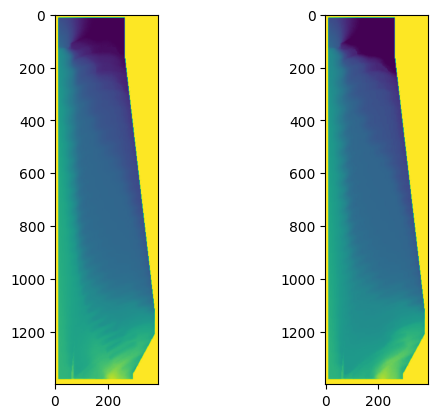

In [20]:



print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )

gen_pil_image, real_pil_image = generate_img_per_index(17)


fig, ax = plt.subplots(1,2)
ax[0].imshow(gen_pil_image)
ax[1].imshow(real_pil_image)




(668, 10)
(168, 10)
[314 287 660]
['tg_Ng0_Pci90_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci90_H0_Wp0_Ph300_Ox21_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci90_H0_Wp0_Ph300_Ox21_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8D7FF951D0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8D7FFAF9D0>
[186 282 104]
['tg_Ng80_Pci120_H0_Wp0_Ph300_Ox27_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng80_Pci120_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng80_Pci120_H0_Wp0_Ph300_Ox27_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DE9DAB610>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DE9DABB90>
[340 272 175]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox30_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox30_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Ima

/Users/user/opt/anaconda3/envs/py37_new_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == "__main__":


[303 622 149]
['tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow7.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DEAED2FD0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DEAED2ED0>
[343  60 331]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox24_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox24_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8D6A08A350>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8D6A08A1D0>
[405 187 106]
['tg_Ng40_Pci10_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng40_Pci10_H0_Wp0_Ph300_Ox21_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L 

[ 79 652 152]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBA626A50>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBA626A90>
[338 412 295]
['tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow6.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow4.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox30_Ow9.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8D6B545890>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8D6B545E10>
[ 88 276 593]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox24_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L s

[450 370 339]
['tg_Ng0_Pci70_H0_Wp0_Ph300_Ox30_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci70_H0_Wp0_Ph300_Ox27_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci70_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DEB2D4110>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DEB2D40D0>
[417  52 202]
['tg_Ng80_Pci20_H0_Wp0_Ph300_Ox23_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng80_Pci20_H0_Wp0_Ph300_Ox23_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng80_Pci20_H0_Wp0_Ph300_Ox23_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBAA71910>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBAA71F50>
[635 255 292]
['tg_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L s

(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DFBE77C50>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DEC9B5910>
[ 85 173 456]
['tg_Ng0_Pci90_H0_Wp0_Ph300_Ox30_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci90_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci90_H0_Wp0_Ph300_Ox27_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DFBEFC5D0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DFBEFC710>
[412 338 220]
['tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow4.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow6.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox30_Ow4.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DECBED4D0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DECBED850>
[654 576 141]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow4.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow6.0_Hbt1410

(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8D6C775E90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DFD09B550>
[512 445 312]
['tg_Ng150_Pci100_H0_Wp0_Ph300_Ox30_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci100_H0_Wp0_Ph300_Ox30_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci100_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DFD1040D0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DFD104190>
[560 267 101]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox21_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox21_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBBC74450>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBBC74390>
[470 537  30]
['tg_Ng38_Pci0_H0_Wp0_Ph300_Ox27_Ow5.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1

(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBBEA7E90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBC094910>
[164 170 544]
['tg_Ng0_Pci175_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox27_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox30_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBC5A03D0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBC5A0310>
[440 117 310]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow4.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow7.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBC6CB410>
<PIL.Image.Image image mode=L size=390x1400 at 0x7F8DBC6CB290>
[379 143 490]
['tg_Ng0_Pci150_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci150_H0_Wp0_Ph300_Ox27_Ow7_Hbt1459.8_

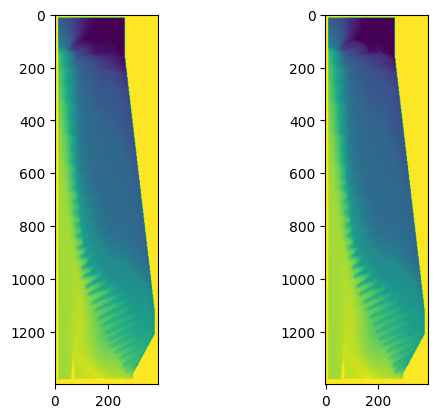

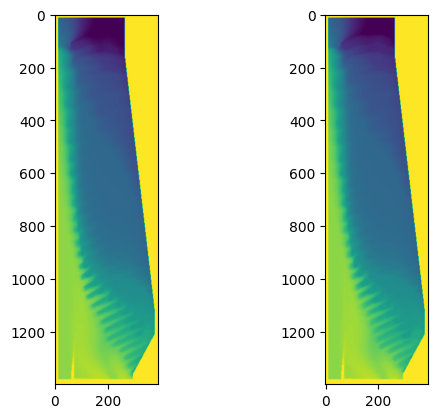

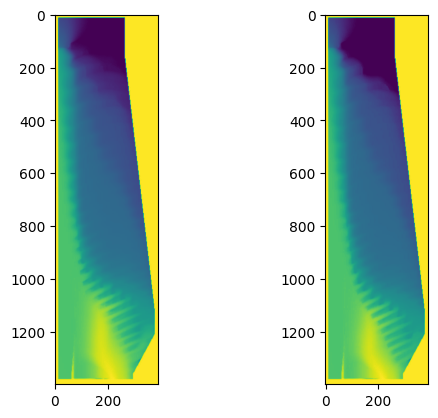

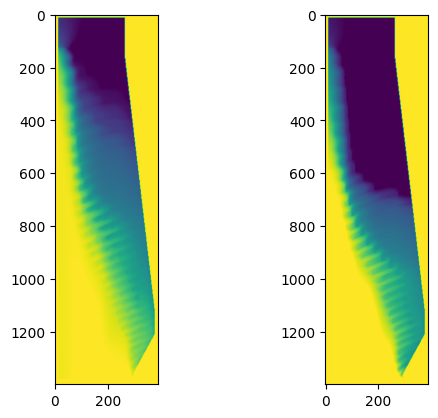

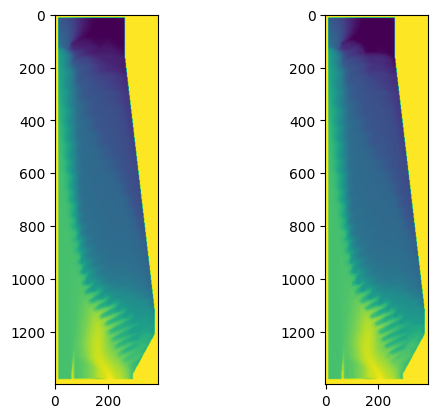

...

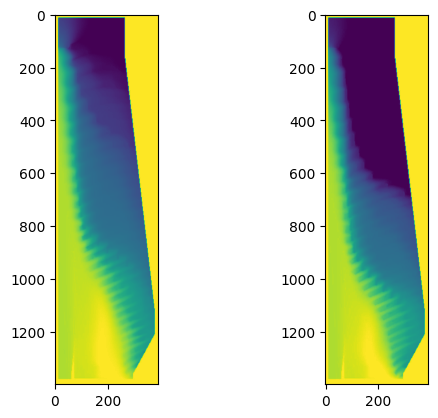

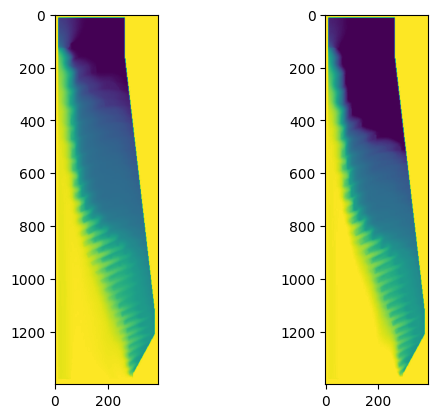

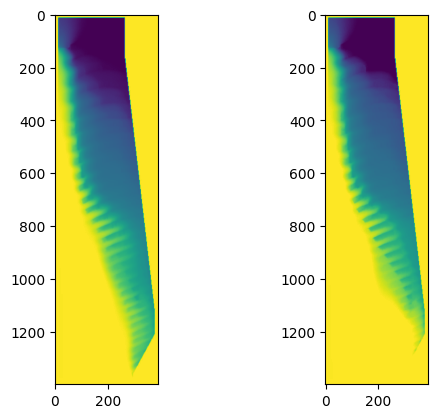

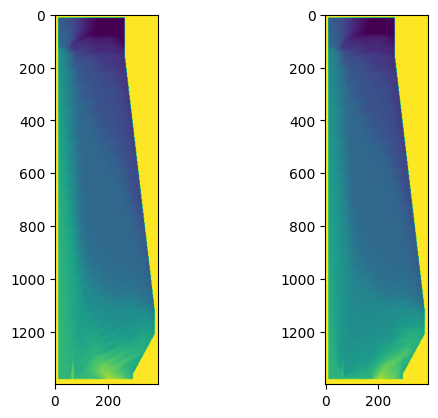

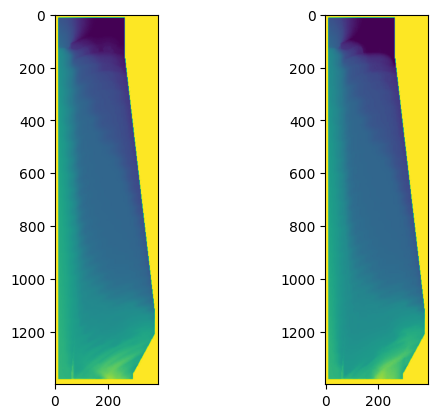

In [23]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


for test_i in range( conditions_matrix_test.shape[0]  ):

    gen_pil_image, real_pil_image = generate_img_per_index(test_i)

    fig, ax = plt.subplots(1,2)
    ax[0].imshow(gen_pil_image)
    ax[1].imshow(real_pil_image)
